<a href="https://colab.research.google.com/github/guillepascual41-maker/Imagen_2_David-y-Guillermo/blob/main/Imagen_2_David_y_Guillermo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Para comenzar
## Lo primero de todo es descargar la imagen desde el link de drive proporcionado. Además, una vez descargada comprobamos y verificamos y evita posibles errores de ruta o nombre. Lo siguiente ya es cargar la imagen para verla por pantalla y empezar a trabajar sobre ella.

In [1]:
!pip install onedrivedownloader
from onedrivedownloader import download

CELL_IMAGES = 'https://universidadfv-my.sharepoint.com/:i:/g/personal/alberto_desantos_ufv_es/EVq7WDpsmUdNpimem9qtc-0Btj8E9McUzg9IccKZN2f-rg?e=tNV0Dz'
download(CELL_IMAGES, filename="celulas.jpeg")


100%|██████████| 336k/336k [00:00<00:00, 9.41MiB/s]


'celulas.jpeg'

In [2]:
import os
print(os.listdir())


['.config', 'celulas.jpeg', 'sample_data']


Imagen cargada correctamente


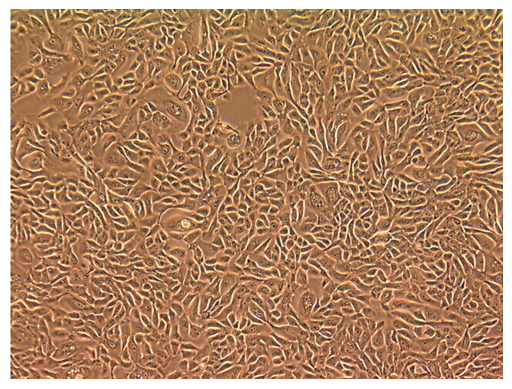

In [3]:
import cv2
from skimage import io, color
from skimage.filters import threshold_niblack, threshold_sauvola
import matplotlib.pyplot as plt


img = cv2.imread('celulas.jpeg')
if img is None:
    print("Error: imagen no cargada, revisa el nombre y la extensión.")
else:
    print("Imagen cargada correctamente")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


##Con este codigo lo que buscamos es analizar los distintos canales de color: RGB, LAB Y HSV sobre el que las celulas se visualizan de manera mas clara, algo que facilitará el trabajo posteriormente. Tras observarlas, nos quedamos concretamente con el canal V (HSV) donde ligeramente se ven mas claras y diferenciadas.

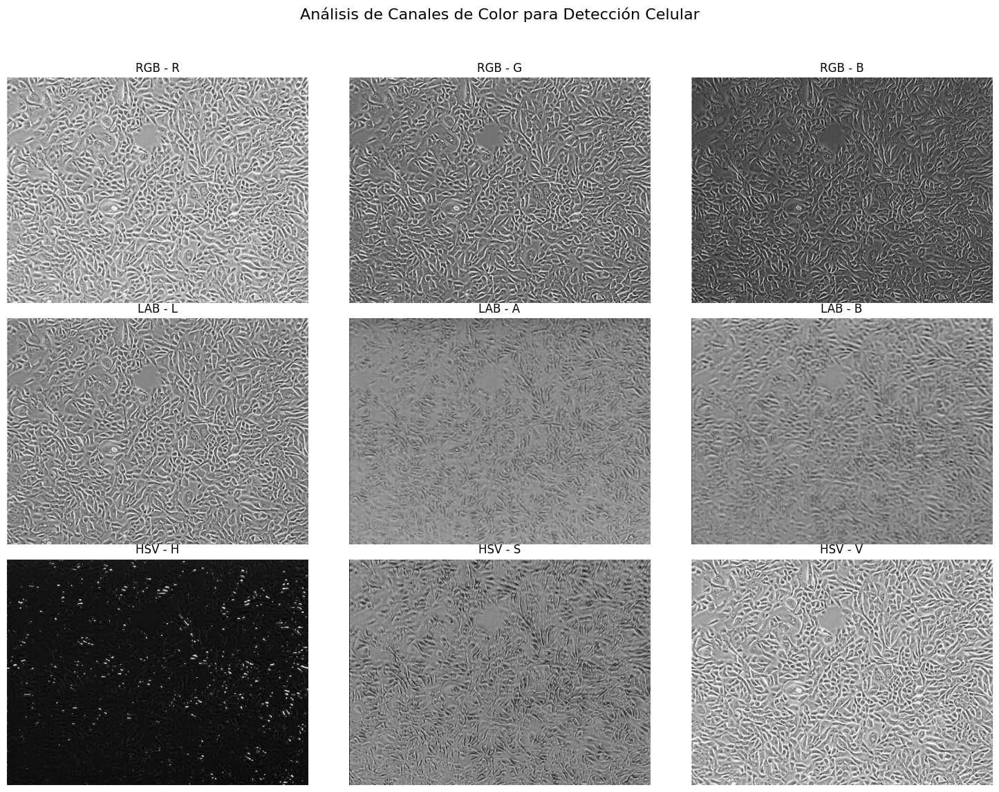

In [4]:
image_path = 'celulas.jpeg'
original_bgr = cv2.imread(image_path)

if original_bgr is None:
    raise FileNotFoundError(f"Error: No se pudo cargar la imagen desde {image_path}")


rgb_image = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2RGB)
lab_image = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2LAB)
hsv_image = cv2.cvtColor(original_bgr, cv2.COLOR_BGR2HSV)


channels_to_plot = {
    'RGB - R': rgb_image[:, :, 0],
    'RGB - G': rgb_image[:, :, 1],
    'RGB - B': rgb_image[:, :, 2],
    'LAB - L': lab_image[:, :, 0],
    'LAB - A': lab_image[:, :, 1],
    'LAB - B': lab_image[:, :, 2],
    'HSV - H': hsv_image[:, :, 0],
    'HSV - S': hsv_image[:, :, 1],
    'HSV - V': hsv_image[:, :, 2],
}


plt.figure(figsize=(15, 12))
i = 1

for title, channel in channels_to_plot.items():
    plt.subplot(3, 3, i)
    plt.imshow(channel, cmap='gray')
    plt.title(title)
    plt.axis('off')
    i += 1

plt.suptitle('Análisis de Canales de Color para Detección Celular', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

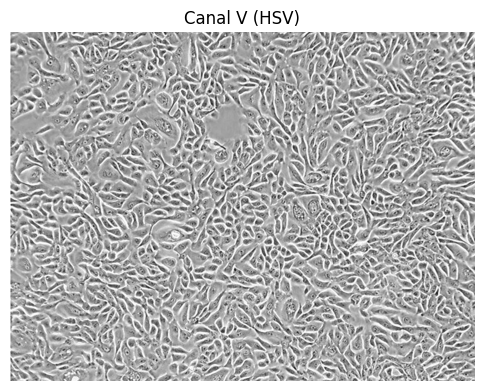

Dimensiones del canal V: (768, 1024)
Valor mínimo: 2
Valor máximo: 255


In [6]:
import numpy as np

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

v_channel = hsv[:,:,2]

plt.figure(figsize=(6,6))
plt.imshow(v_channel, cmap='gray')
plt.title("Canal V (HSV)")
plt.axis("off")
plt.show()

print("Dimensiones del canal V:", v_channel.shape)
print("Valor mínimo:", np.min(v_channel))
print("Valor máximo:", np.max(v_channel))


##Probamos varios métodos de umbralización, incluyendo umbralización global, Otsu y adaptativa media, pero finalmente seleccionamos la umbralización adaptativa gaussiana sobre nuestro canal V, porque ofrecía el mayor contraste y precisión para la segmentación de nuestras células. En las pruebas, observamos que la separación entre células y fondo era mucho más clara con la gaussiana, permitiendo detectar las estructuras celulares con menos errores y fragmentaciones.

##La principal ventaja de la umbralización gaussiana es que calcula el umbral para cada pequeña región de la imagen usando una ponderación local con función gaussiana, lo que la hace robusta frente a variaciones de iluminación y ruido en imágenes.

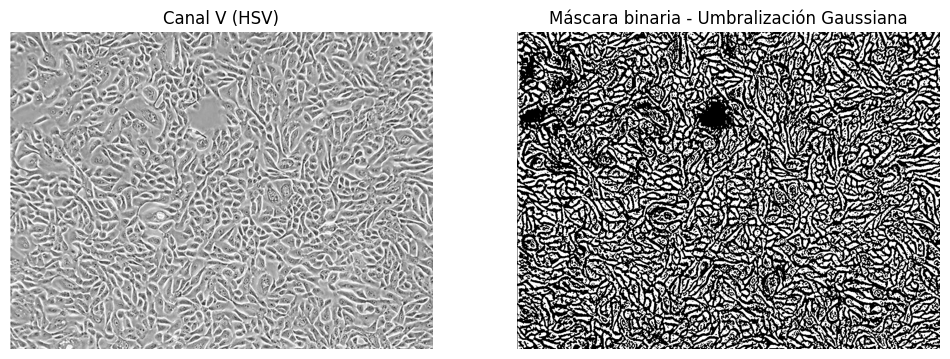

In [7]:

mask = cv2.adaptiveThreshold(
    v_channel, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    25, 8
)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(v_channel, cmap='gray')
plt.title('Canal V (HSV)')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mask, cmap='gray')
plt.title('Máscara binaria - Umbralización Gaussiana')
plt.axis('off')
plt.show()



##El objetivo de este bloque es limpiar la imagen binaria tras la segmentación celular para quedarnos únicamente con las regiones que, por su tamaño, pueden corresponder a células reales individuales. En este caso hemos ido modificando ese valor de area_min hasta que hemos considerado que quitaba las suficientes particulas innecesarias y que causarían confusiones en el conteo final.

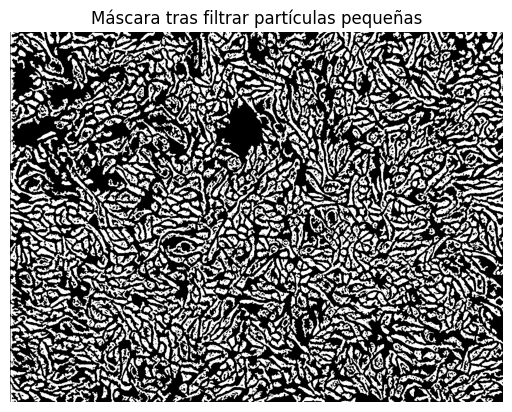

In [8]:
from scipy import ndimage
import matplotlib.pyplot as plt


labels, num = ndimage.label(mask)

area_min = 60
area_max = 4000

mask_filtrada = np.zeros_like(mask)
for i in range(1, num + 1):
    reg = (labels == i)
    area = np.sum(reg)
    if area_min < area < area_max:
        mask_filtrada[reg] = 255

plt.imshow(mask_filtrada, cmap='gray')
plt.title('Máscara tras filtrar partículas pequeñas')
plt.axis('off')
plt.show()


##La dilatación en este bloque tiene como objetivo principal unir fragmentos cercanos dentro de cada célula y suavizar sus bordes tras el filtrado por área ya que observamos aun fragmentos que no estan del todo unidos y nos van a perjudicar y dar datos erroneos en el conteo. Ibamos modificando el tamaño del kernel y probando a variar el número de interacciones, quedandonos con una matriz de 3x3 donde mejor se observaba.

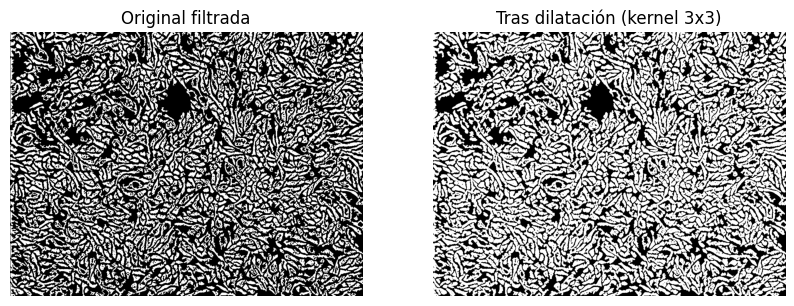

In [9]:

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

mask_dilatada = cv2.dilate(mask_filtrada, kernel, iterations=1)

plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(mask_filtrada, cmap='gray')
plt.title('Original filtrada')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mask_dilatada, cmap='gray')
plt.title('Tras dilatación (kernel 3x3)')
plt.axis('off')
plt.show()


##De aqui en adelante iniciamos el proceso previo a la segmentación watershed.Primeramente aplicamos la transformada de distancia que calcula, para cada píxel blanco, qué tan lejos está del borde más cercano. De esta forma, los valores más altos suelen encontrarse en el centro de cada célula.

## Si aplicamos un umbral sobre este mapa de distancias, obtenemos puntos o pequeñas regiones situadas justo en el centro de las células.Estas zonas se las llama semillas internas,que es lo que vemos en la imagen a continuación ya que marcan con alta probabilidad la posición de cada célula y sirven como punto de inicio para la segmentación mediante Watershed. Además,visualizamos el fondo seguro que lo que queremos representar son las zonas donde estamos completamente seguros de que no hay células. Con ello el método de segmentación Watershed sabrá dónde parar cuando “inunde” la imagen desde las semillas de cada célula.

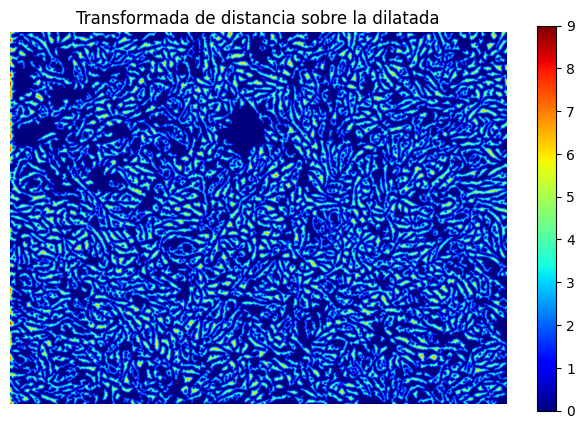

In [10]:
dist_transform = cv2.distanceTransform(mask_dilatada, cv2.DIST_L2, 5)

plt.figure(figsize=(8,5))
plt.imshow(dist_transform, cmap='jet')
plt.title("Transformada de distancia sobre la dilatada")
plt.axis('off')
plt.colorbar()
plt.show()


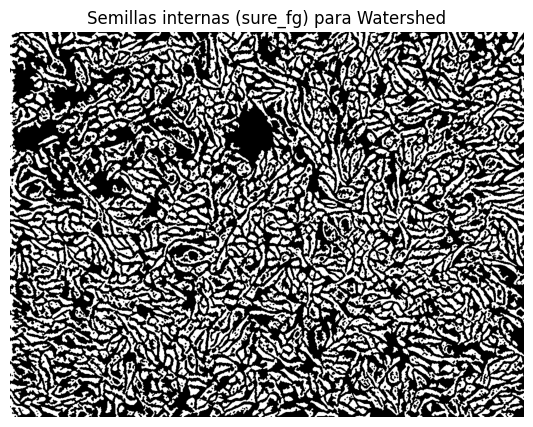

In [11]:
_, sure_fg = cv2.threshold(dist_transform, 0.15 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)

plt.figure(figsize=(7,5))
plt.imshow(sure_fg, cmap='gray')
plt.title("Semillas internas (sure_fg) para Watershed")
plt.axis('off')
plt.show()


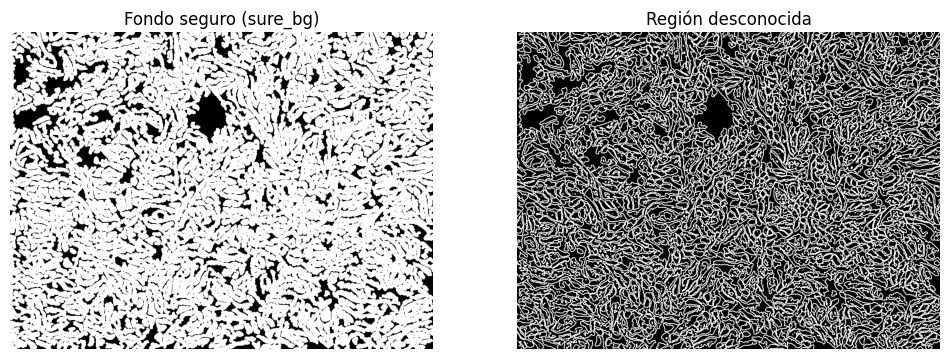

In [12]:
sure_bg = cv2.dilate(mask_dilatada, np.ones((3,3), np.uint8), iterations=1)
unknown = cv2.subtract(sure_bg, sure_fg)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(sure_bg, cmap='gray')
plt.title("Fondo seguro (sure_bg)")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(unknown, cmap='gray')
plt.title("Región desconocida")
plt.axis('off')
plt.show()


#En este paso buscamos verificar y observar de manera clara las regiones de celulas identificadas para ver que tan bien y claro han definido las zonas de inicio de cada célula con respecto del fondo o de las regiones más bien inciertas .

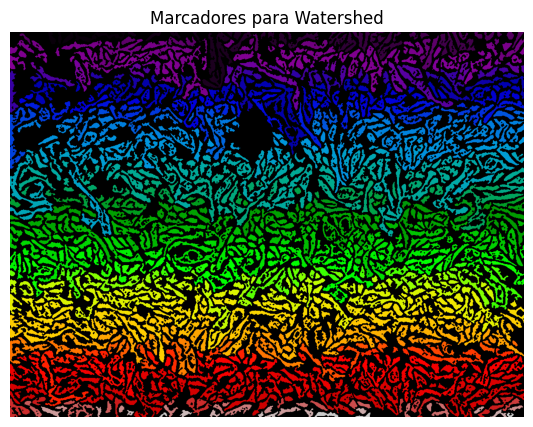

In [13]:
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0

plt.figure(figsize=(7,5))
plt.imshow(markers, cmap='nipy_spectral')
plt.title("Marcadores para Watershed")
plt.axis('off')
plt.show()


#En este paso ya aplicamos el método de segmentación Watershed propiamente dicho, utilizando los marcadores definidos previamente expandiendo las regiones hasta encontrar las fronteras entre las distintas células. Como podemos observar, identificia con bastante precisión lsa regiones reales de las células.

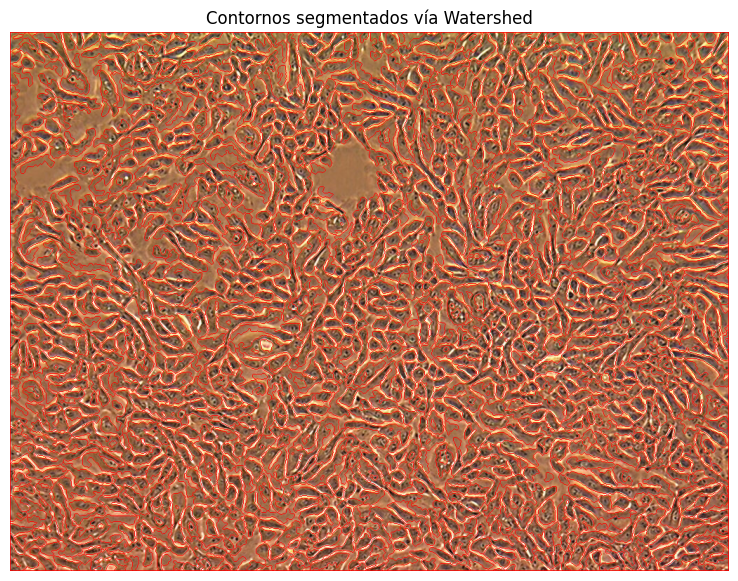

In [14]:
img_ws = img.copy()
img_ws_rgb = cv2.cvtColor(img_ws, cv2.COLOR_BGR2RGB)

watershed_input = cv2.cvtColor(mask_dilatada, cv2.COLOR_GRAY2BGR)
cv2.watershed(watershed_input, markers)


img_ws_rgb[markers == -1] = [255,0,0]

plt.figure(figsize=(11,7))
plt.imshow(img_ws_rgb)
plt.title('Contornos segmentados vía Watershed')
plt.axis('off')
plt.show()


##En esta parte del código se extraen las regiones internas segmentadas por el algoritmo Watershed.Para ello, se crea una nueva máscara que solo conserva los píxeles pertenecientes a las regiones identificadas como células, descartando tanto el fondo como los bordes de separación.Por lo tanto, la imagen resultante muestra en blanco las células segmentadas individualmente.

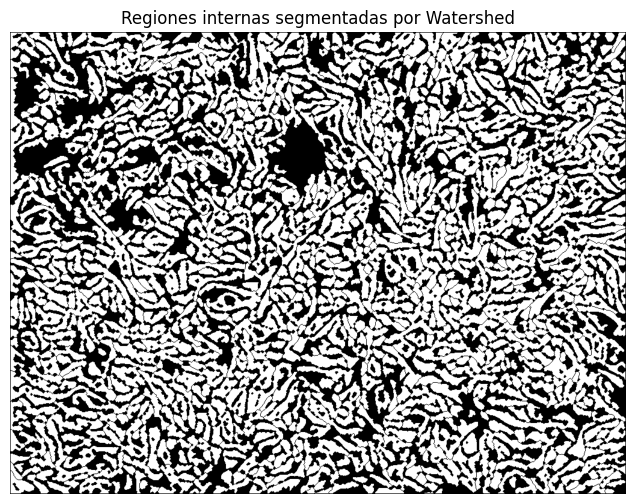

In [15]:
mask_ws_regions = np.zeros_like(mask_dilatada)
mask_ws_regions[markers > 1] = 255

plt.figure(figsize=(8,6))
plt.imshow(mask_ws_regions, cmap='gray')
plt.title('Regiones internas segmentadas por Watershed')
plt.axis('off')
plt.show()


#Finalmente ya procedemos al conteo de las células obtenidas. Primero, se etiquetan todas las regiones segmentadas en la mascara previa, asignando un identificador distinto a cada posible célula. Además, ibamos definiendo las regiones que entraban dentro del conteo definido por (area_min y area_max), lo que no ha permitido ir quitandonos de pequeñas marcas indefinidas que aun se han quedado y así aumentar todo lo posibe el conteo.


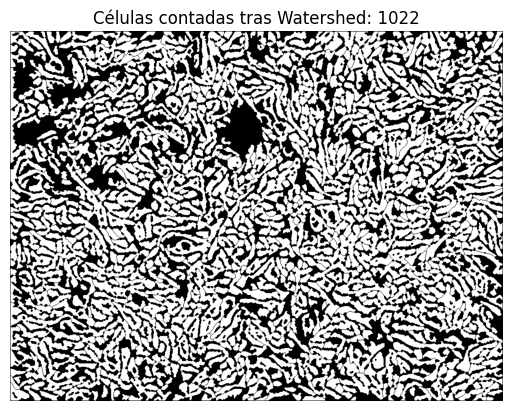

Células contadas tras Watershed + filtro: 1022


In [16]:
mask_ws_regions = np.zeros_like(mask_dilatada)
mask_ws_regions[markers > 1] = 255


labels, num = ndimage.label(mask_ws_regions)


area_min = 50
area_max = 4000

mask_final = np.zeros_like(mask_ws_regions)
celulas = 0
for i in range(1, num + 1):
    region = (labels == i)
    area = np.sum(region)
    if area_min < area < area_max:
        mask_final[region] = 255
        celulas += 1

plt.imshow(mask_final, cmap='gray')
plt.title(f'Células contadas tras Watershed: {celulas}')
plt.axis('off')
plt.show()

print(f'Células contadas tras Watershed + filtro: {celulas}')


##En este caso, hemos aplicado el algoritmo Watershed después de realizar la umbralización y las operaciones morfológicas sobre la imagen. Somos conscientes de que, conceptualmente, Watershed suele emplearse en etapas previas, como método principal de segmentación para separar regiones solapadas o mal definidas. Sin embargo, en nuestro flujo de trabajo la imagen ya presentaba las células bastante diferenciadas tras el preprocesado, por lo que el objetivo de aplicar Watershed fue distinto: refinar los contornos y unir aquellas células que habían quedado parcialmente separadas, ayudando así a depurar la segmentación final.

##No obstante, como se muestra en el código de abajo, también probamos un enfoque alternativo partiendo directamente de la imagen tras la umbralización, aplicando morfología para limpiar y realizar el conteo directamente sobre la máscara resultante, sin Watershed. En este caso, el resultado muestra un número ligeramente mayor de células, debido a que se detectan pequeñas regiones que no llegaron a unirse completamente o que no están bien definidas, generando un leve sobreconteo.

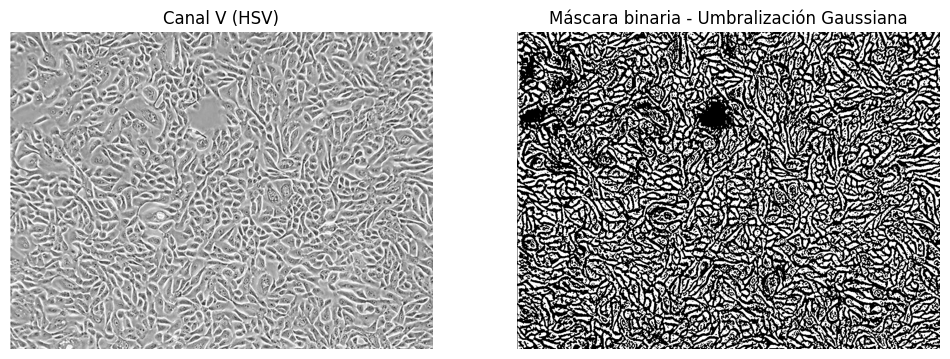

In [17]:
mask = cv2.adaptiveThreshold(
    v_channel, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    cv2.THRESH_BINARY_INV,
    25, 8
)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(v_channel, cmap='gray')
plt.title('Canal V (HSV)')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(mask, cmap='gray')
plt.title('Máscara binaria - Umbralización Gaussiana')
plt.axis('off')
plt.show()

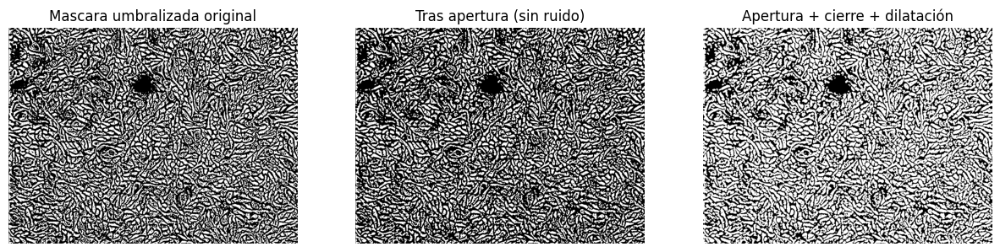

In [18]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
mask_ap = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
mask_cl = cv2.morphologyEx(mask_ap, cv2.MORPH_CLOSE, kernel)
mask_clean = cv2.dilate(mask_cl, kernel, iterations=1)

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(mask, cmap='gray')
plt.title('Mascara umbralizada original')
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(mask_ap, cmap='gray')
plt.title('Tras apertura (sin ruido)')
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(mask_clean, cmap='gray')
plt.title('Apertura + cierre + dilatación')
plt.axis('off')
plt.show()


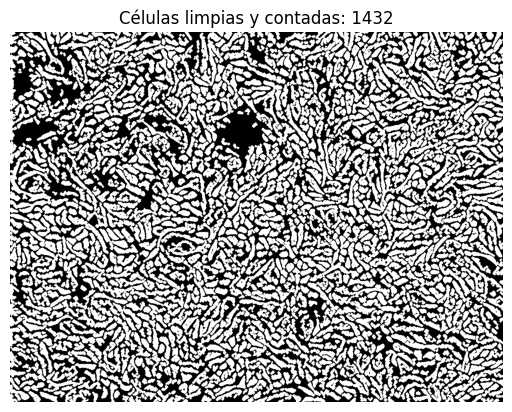

Células contadas tras morfología y filtro: 1432


In [19]:
labels, num = ndimage.label(mask_clean)
area_min = 50
area_max = 4000

mask_final = np.zeros_like(mask_clean)
cell_count = 0
for i in range(1, num+1):
    reg = (labels == i)
    area = np.sum(reg)
    if area_min < area < area_max:
        mask_final[reg] = 255
        cell_count += 1

plt.imshow(mask_final, cmap='gray')
plt.title(f'Células limpias y contadas: {cell_count}')
plt.axis('off')
plt.show()
print(f'Células contadas tras morfología y filtro: {cell_count}')
